# Hand Gesture Recognition 
This project aims to develop a hand gesture recognition system using Convolutional Neural Networks (CNNs). The database used for training and testing the model is composed of a set of near infrared images acquired by the Leap Motion sensor. It consists of 5 different hand gestures performed by 10 subjects, comprising, comprissing 5 men and 5 women.

In [1]:
# Cv
#=================================================================
import cv2 
# File Reading 
#=================================================================
import os
import glob 

# Data Manipulation 
#=================================================================
import numpy as np 
import pandas as pd
# Data Visualization 
#=================================================================
import matplotlib.pyplot as plt 
import seaborn as sns 
from tqdm import tqdm

# Deep Learning Model  and Layers 
#=================================================================
import tensorflow as tf
from keras.layers import MaxPool2D , Conv2D , Flatten ,Dense , LeakyReLU
from keras.models import Sequential 

#Random
#=================================================================
import random

# Data preprocessing 
#=================================================================
from sklearn.model_selection import train_test_split

#Metrics 
#=================================================================
from sklearn.metrics import confusion_matrix, classification_report

In [2]:
foldar_names=[]
for i in range(10):
    folder=r"C:\Users\Lenovo\Documents\iaii\machine learning\INTERNSHIP\datasets\leapGestRecog/0{}".format(i)
    foldar_names.append(folder)

In [4]:
files_names = ['01_palm', '02_l', '03_fist', '04_fist_moved', '05_thumb']

**Display 3 images for each file from eav=ch class**

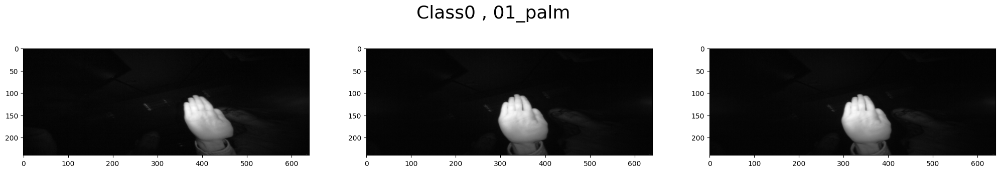

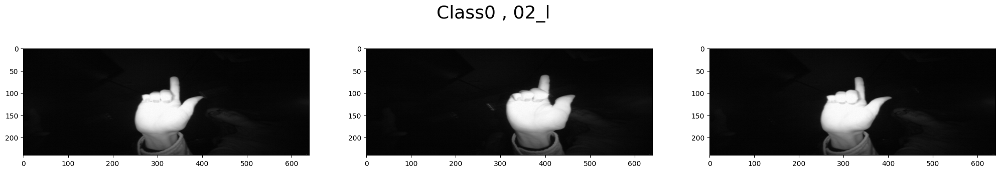

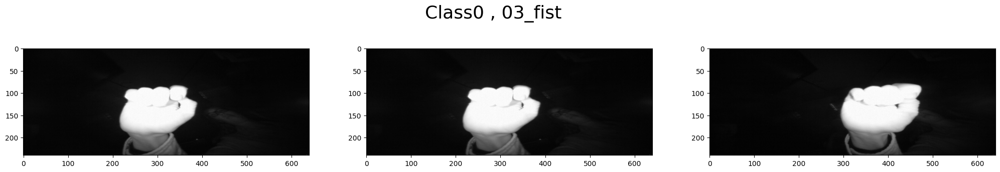

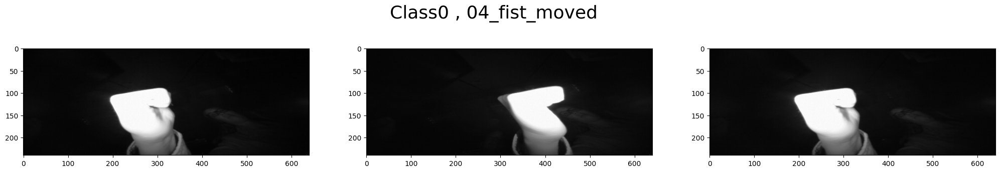

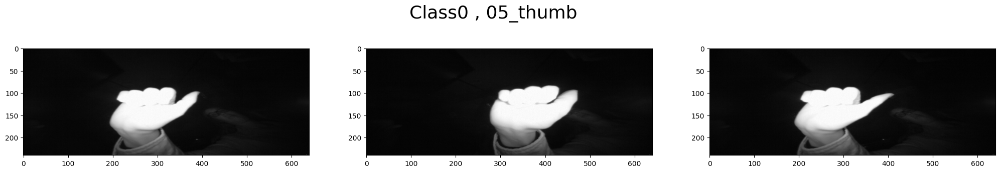

...

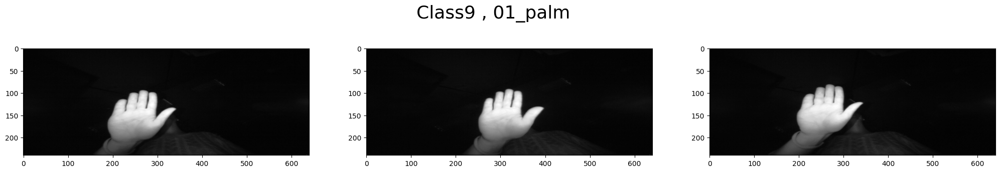

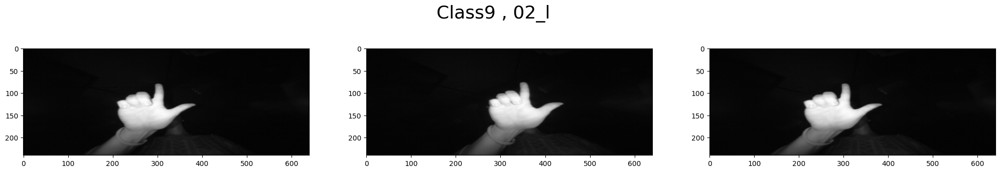

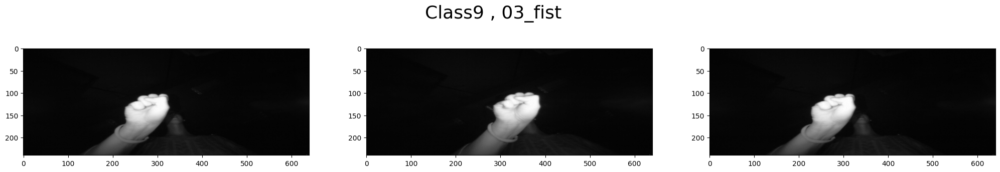

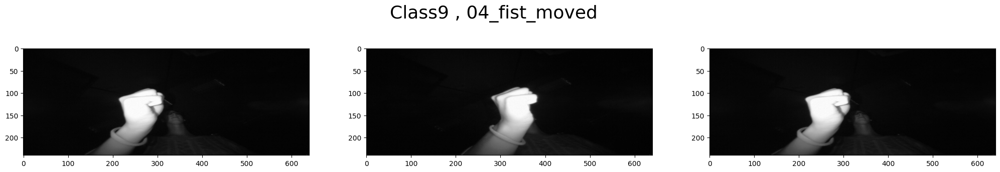

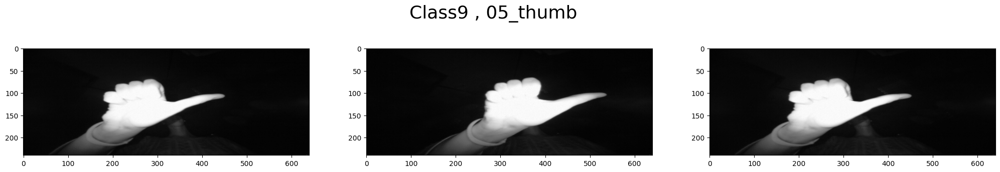

In [5]:
for folder in foldar_names:
        Class_num=folder[-1]
        for file in files_names:
            path = os.path.join(folder, file)
            x=0
            fig, axes = plt.subplots(1,3, figsize=(25, 4))  
            for img in os.listdir(path):
                
                
                img_array = cv2.imread(os.path.join(path, img), cv2.IMREAD_GRAYSCALE)
                axes[x].imshow(img_array, cmap='gray')
                x += 1
                if x == 3: 
                    break

            plt.suptitle(f"Class{Class_num} , {file}", fontsize=26)
            plt.show()

In [6]:
training_data = []

def create_training_data():
    for folder in foldar_names:
        Class_num=folder[-1]
        print('Class ' ,Class_num)
        for file in files_names:
            path = os.path.join(folder, file)

            print('Class ' ,Class_num,file)
#             c=0
            
            for img in tqdm(os.listdir(path)):
#                 if(c==100):
#                     break
#                 c+=1
                img_array = cv2.imread(os.path.join(path, img), cv2.IMREAD_GRAYSCALE)
                
          
                training_data.append([img_array,int(Class_num)])
                        
    
create_training_data()  

Class  0
Class  0 01_palm


100%|██████████| 200/200 [00:00<00:00, 244.48it/s]


Class  0 02_l


100%|██████████| 200/200 [00:00<00:00, 246.15it/s]


Class  0 03_fist


100%|██████████| 200/200 [00:00<00:00, 207.18it/s]


Class  0 04_fist_moved


100%|██████████| 200/200 [00:00<00:00, 229.55it/s]


Class  0 05_thumb


100%|██████████| 200/200 [00:00<00:00, 304.32it/s]


Class  1
Class  1 01_palm


100%|██████████| 200/200 [00:00<00:00, 324.15it/s]


Class  1 02_l


100%|██████████| 200/200 [00:00<00:00, 208.13it/s]


Class  1 03_fist


100%|██████████| 200/200 [00:00<00:00, 269.90it/s]


Class  1 04_fist_moved


100%|██████████| 200/200 [00:00<00:00, 227.01it/s]


Class  1 05_thumb


100%|██████████| 200/200 [00:00<00:00, 207.61it/s]


Class  2
Class  2 01_palm


100%|██████████| 200/200 [00:00<00:00, 223.09it/s]


Class  2 02_l


100%|██████████| 200/200 [00:01<00:00, 194.39it/s]


Class  2 03_fist


100%|██████████| 200/200 [00:00<00:00, 286.42it/s]


Class  2 04_fist_moved


100%|██████████| 200/200 [00:00<00:00, 308.39it/s]


Class  2 05_thumb


100%|██████████| 200/200 [00:00<00:00, 266.31it/s]


Class  3
Class  3 01_palm


100%|██████████| 200/200 [00:00<00:00, 272.93it/s]


Class  3 02_l


100%|██████████| 200/200 [00:00<00:00, 315.46it/s]


Class  3 03_fist


100%|██████████| 200/200 [00:00<00:00, 338.42it/s]


Class  3 04_fist_moved


100%|██████████| 200/200 [00:00<00:00, 262.15it/s]


Class  3 05_thumb


100%|██████████| 200/200 [00:00<00:00, 239.99it/s]


Class  4
Class  4 01_palm


100%|██████████| 200/200 [00:00<00:00, 313.48it/s]


Class  4 02_l


100%|██████████| 200/200 [00:00<00:00, 327.05it/s]


Class  4 03_fist


100%|██████████| 200/200 [00:00<00:00, 278.09it/s]


Class  4 04_fist_moved


100%|██████████| 200/200 [00:00<00:00, 327.33it/s]


Class  4 05_thumb


100%|██████████| 200/200 [00:00<00:00, 260.58it/s]


Class  5
Class  5 01_palm


100%|██████████| 200/200 [00:00<00:00, 289.16it/s]


Class  5 02_l


100%|██████████| 200/200 [00:00<00:00, 292.75it/s]


Class  5 03_fist


100%|██████████| 200/200 [00:00<00:00, 305.81it/s]


Class  5 04_fist_moved


100%|██████████| 200/200 [00:00<00:00, 317.96it/s]


Class  5 05_thumb


100%|██████████| 200/200 [00:00<00:00, 223.63it/s]


Class  6
Class  6 01_palm


100%|██████████| 200/200 [00:00<00:00, 302.55it/s]


Class  6 02_l


100%|██████████| 200/200 [00:00<00:00, 319.74it/s]


Class  6 03_fist


100%|██████████| 200/200 [00:00<00:00, 281.01it/s]


Class  6 04_fist_moved


100%|██████████| 200/200 [00:00<00:00, 230.76it/s]


Class  6 05_thumb


100%|██████████| 200/200 [00:00<00:00, 255.91it/s]


Class  7
Class  7 01_palm


100%|██████████| 200/200 [00:01<00:00, 193.18it/s]


Class  7 02_l


100%|██████████| 200/200 [00:01<00:00, 198.81it/s]


Class  7 03_fist


100%|██████████| 200/200 [00:00<00:00, 219.54it/s]


Class  7 04_fist_moved


100%|██████████| 200/200 [00:01<00:00, 150.88it/s]


Class  7 05_thumb


100%|██████████| 200/200 [00:00<00:00, 204.60it/s]


Class  8
Class  8 01_palm


100%|██████████| 200/200 [00:01<00:00, 188.55it/s]


Class  8 02_l


100%|██████████| 200/200 [00:01<00:00, 118.41it/s]


Class  8 03_fist


100%|██████████| 200/200 [00:01<00:00, 186.55it/s]


Class  8 04_fist_moved


100%|██████████| 200/200 [00:00<00:00, 210.53it/s]


Class  8 05_thumb


100%|██████████| 200/200 [00:01<00:00, 123.29it/s]


Class  9
Class  9 01_palm


100%|██████████| 200/200 [00:01<00:00, 191.76it/s]


Class  9 02_l


100%|██████████| 200/200 [00:00<00:00, 282.49it/s]


Class  9 03_fist


100%|██████████| 200/200 [00:00<00:00, 255.59it/s]


Class  9 04_fist_moved


100%|██████████| 200/200 [00:01<00:00, 176.75it/s]


Class  9 05_thumb


100%|██████████| 200/200 [00:01<00:00, 183.92it/s]


**printing the shape of the first image from each class**

In [7]:
for folder in foldar_names:
    class_num = folder[-1]
    print('Class', class_num)
    for file in files_names:
        path = os.path.join(folder, file)
       
        for img in os.listdir(path):
            img_array = cv2.imread(os.path.join(path, img), cv2.IMREAD_GRAYSCALE)
            print("Image shape:", img_array.shape,"\n")
            break  # To print only the first image shape for each file
        break  # To print only the first file shape for each folder

Class 0
Image shape: (240, 640) 

Class 1
Image shape: (240, 640) 

Class 2
Image shape: (240, 640) 

Class 3
Image shape: (240, 640) 

Class 4
Image shape: (240, 640) 

Class 5
Image shape: (240, 640) 

Class 6
Image shape: (240, 640) 

Class 7
Image shape: (240, 640) 

Class 8
Image shape: (240, 640) 

Class 9
Image shape: (240, 640) 



**Checking if all images have the same size or not**

In [8]:
def check_image_sizes():
    first_img_shape = None
    for folder in foldar_names:
        for file in files_names:
            path = os.path.join(folder, file)
            for img in os.listdir(path):
                img_array = cv2.imread(os.path.join(path, img), cv2.IMREAD_GRAYSCALE)
                if first_img_shape is None:
                    first_img_shape = img_array.shape
                elif img_array.shape != first_img_shape:
                    print("Image sizes are not consistent.")
                    return False
    print("All images have the same size:", first_img_shape)
   
check_image_sizes()

All images have the same size: (240, 640)


### Shuffling

**getting the classes of the first 5 images**

In [9]:
for i in range(5):
    print("Class number for image", i+1, ":", training_data[i][1])

Class number for image 1 : 0
Class number for image 2 : 0
Class number for image 3 : 0
Class number for image 4 : 0
Class number for image 5 : 0


**Suffling and display the first 10 classes after suffling**

In [10]:
random.shuffle(training_data)

for i in range(15):
    print(f"Sample {i+1}:")
    print("Class number:", training_data[i][1],"\n") 

Sample 1:
Class number: 0 

Sample 2:
Class number: 5 

Sample 3:
Class number: 2 

Sample 4:
Class number: 0 

Sample 5:
Class number: 3 

Sample 6:
Class number: 0 

Sample 7:
Class number: 6 

Sample 8:
Class number: 6 

Sample 9:
Class number: 9 

Sample 10:
Class number: 9 

Sample 11:
Class number: 6 

Sample 12:
Class number: 9 

Sample 13:
Class number: 0 

Sample 14:
Class number: 0 

Sample 15:
Class number: 6 



### Preprocessing

**Feature Selection**

In [11]:
X=[]
y=[]

for feature,label in training_data:
    X.append(feature)
    y.append(label)
    
X = np.array(X)
y = np.array(y)

**Splitting the data into training and testing sets**

In [12]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(8000, 240, 640)
(8000,)
(2000, 240, 640)
(2000,)


**Scalling the data**

In [13]:
X_train = X_train/255
X_test = X_test/255

### Model Building with Multi Neural Network 

In [14]:
model = Sequential([
    Flatten(input_shape=(240, 640)),
    Dense(64),
    LeakyReLU(alpha=0.1),
    Dense(32),
    LeakyReLU(alpha=0.1),
    Dense(16),
    LeakyReLU(alpha=0.1),
    Dense(10, activation='softmax')
])

c:\Users\Lenovo\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\reshaping\flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\Lenovo\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\activations\leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


**Compile the model**

In [15]:
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

**Train the model**

In [16]:
history = model.fit(X_train, y_train, epochs=3, validation_split=0.1, batch_size=32, verbose=2)

Epoch 1/3
225/225 - 32s - 144ms/step - accuracy: 0.7246 - loss: 1.0109 - val_accuracy: 0.9450 - val_loss: 0.3025
Epoch 2/3
225/225 - 22s - 100ms/step - accuracy: 0.9875 - loss: 0.0833 - val_accuracy: 0.9950 - val_loss: 0.0422
Epoch 3/3
225/225 - 40s - 180ms/step - accuracy: 0.9968 - loss: 0.0242 - val_accuracy: 0.9975 - val_loss: 0.0134


In [17]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten (Flatten)               │ (None, 153600)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │     9,830,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 10)             │           170 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,499,728 (112.53 MB)

 Trainable params: 9,833,242 (37.51 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 19,666,486 (75.02 MB)

In [18]:
loss, accuracy = model.evaluate(X_train, y_train,batch_size=32)
print(f"Training Loss: {loss:.4f}")
print(f"Training Accuracy: {accuracy*100:.2f}%")

250/250 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.9994 - loss: 0.0095
Training Loss: 0.0102
Training Accuracy: 99.91%


In [30]:
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Testing Loss: {loss:.4f}")
print(f"Testing accuracy : {accuracy*100:.2f} %")

63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9975 - loss: 0.0153
Testing Loss: 0.0149
Testing accuracy : 99.75 %


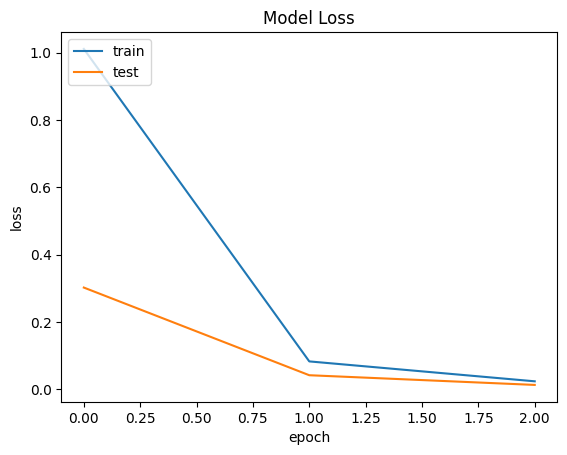

In [20]:

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

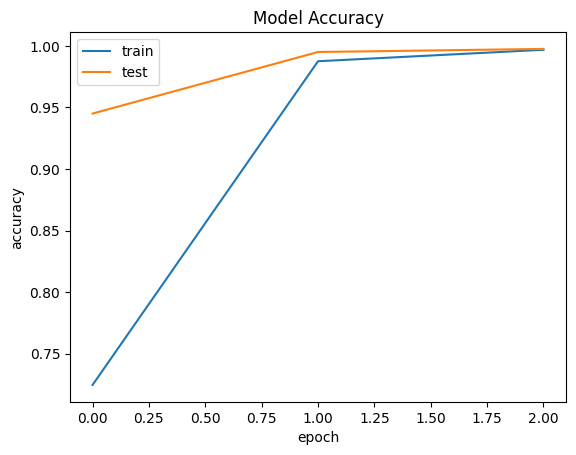

In [21]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('epoch')
plt.ylabel('accuracy')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

**Prediction**

In [22]:
y_pred=model.predict(X_test)
print(y_pred[0])

63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step
[4.9923761e-03 5.2291589e-06 1.1613300e-06 4.3955911e-03 1.2937041e-04
 7.2857556e-06 1.2698643e-04 9.8433256e-01 3.3437295e-03 2.6656480e-03]


In [23]:
y_pred = [np.argmax(i) for i in y_pred]
print(y_pred[1])

4


Text(0.5, 47.7222222222222, 'Predicted Labels')

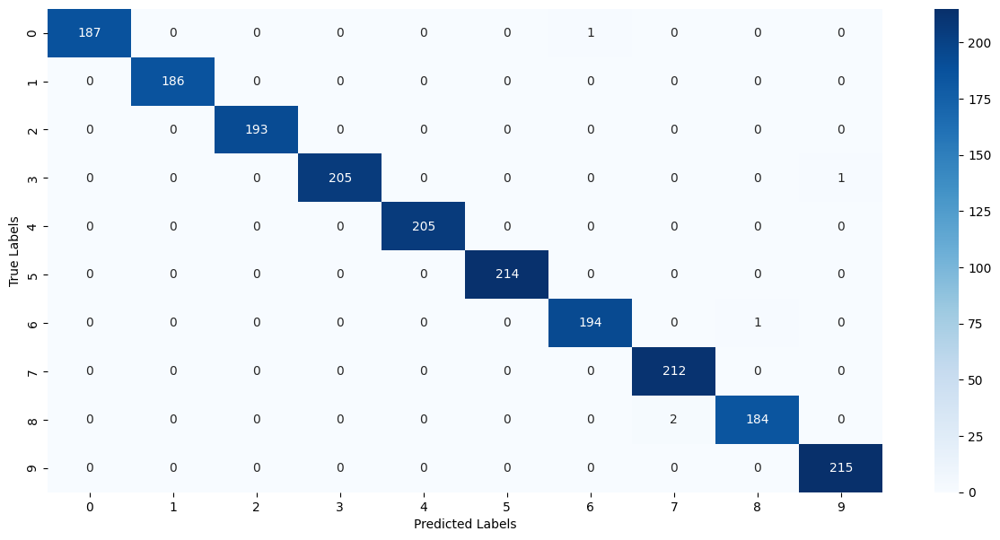

In [25]:
conf_mat = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15,7))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues')
plt.ylabel('True Labels')
plt.xlabel('Predicted Labels')

**Report**

In [26]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00       188
           1       1.00      1.00      1.00       186
           2       1.00      1.00      1.00       193
           3       1.00      1.00      1.00       206
           4       1.00      1.00      1.00       205
           5       1.00      1.00      1.00       214
           6       0.99      0.99      0.99       195
           7       0.99      1.00      1.00       212
           8       0.99      0.99      0.99       186
           9       1.00      1.00      1.00       215

    accuracy                           1.00      2000
   macro avg       1.00      1.00      1.00      2000
weighted avg       1.00      1.00      1.00      2000



In [29]:
# Export the model
model.save('hand_gesture_model.keras')